# Plankton Identifier - Classification from plankton imager

This document provides code to train and run a CNN to classify plankton from images from the plankton imager. It treats this problem as a classification task. The labels are extracted from the folder names.

## Import modules and set parameters

In [1]:
import fastai
from fastai.vision.all import *
print ('You are using FastAI version: ' + fastai.__version__)
# FastAI version in counting paper: 2.0.13

You are using FastAI version: 2.7.13


In [2]:
filename = 'Plankton_imager_v01' # Insert your filename, for repeated experiments with different trainings hyperparameters (see below)
bs = 600 # Insert highest working batchsize here (limited by hardware)
np.random.seed(3)

NOTE TO SELF:

When a class n=1, it gives an error when it ends up in the validation set (and not in the training set). Easy work around is to reset random seed, and hope it ends up in the training set this time.

Nb: bs = 600 gave a usage of ~55000MiB on each GPU (2x A100)

## Getting the data

In [3]:
# Get image paths
path = Path('data/DETAILED_merged');
path.ls()

(#49) [Path('data/DETAILED_merged/Cnidaria_Hydrozoa-polyp'),Path('data/DETAILED_merged/Crustacea_Cirripedia-larvae'),Path('data/DETAILED_merged/artefacts'),Path('data/DETAILED_merged/Crustacea_Copepoda-nauplii'),Path('data/DETAILED_merged/Crustacea_Copepoda_Monstrilloidae'),Path('data/DETAILED_merged/Mollusca_Gastropoda'),Path('data/DETAILED_merged/Cnidaria_Scyphozoa-ephyrae'),Path('data/DETAILED_merged/Fish-eggs'),Path('data/DETAILED_merged/Crustacea_Cladocera'),Path('data/DETAILED_merged/Crustacea_Copepoda_Calanoida')...]

In [4]:
fnames = get_image_files(path)
fnames[:3]

(#3) [Path('data/DETAILED_merged/Cnidaria_Hydrozoa-polyp/pia7.2024-01-11.1210+N00004975.tif'),Path('data/DETAILED_merged/Cnidaria_Hydrozoa-polyp/pia1.2023-08-15.0720+N00024106.tif'),Path('data/DETAILED_merged/Cnidaria_Hydrozoa-polyp/pia1.2023-08-15.0720+N00015347.tif')]

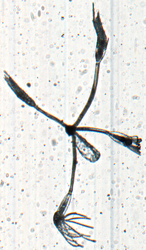

In [5]:
# Check single image
testfoto = str(fnames[0])
img = Image.open(testfoto)
img.to_thumb(250.250)

## Creating a dataset

In [6]:
# Create dataset

block = DataBlock(blocks=(ImageBlock, CategoryBlock), # for regression, change this CategoryBlock
                  splitter=RandomSplitter(),
                  get_items = get_image_files, 
                  get_y = parent_label,
                  #item_tfms=Resize((770,1040), method='squish'), 
                  item_tfms=Resize(300, ResizeMethod.Pad, pad_mode='zeros'), # see page 73 book
                  batch_tfms=[*aug_transforms( #https://docs.fast.ai/vision.augment#aug_transforms
                      mult=1.0, 
                      do_flip=True,
                      flip_vert=True,
                      max_rotate=0.2,
                      min_zoom=1.0,
                      max_zoom=1.1,
                      max_lighting=0.3,
                      max_warp=0.1,
                      p_affine=0.5,
                      p_lighting=0.5,
                      pad_mode='zeros'), 
                              Normalize.from_stats(*imagenet_stats)] 
                 )

In [7]:
#dls = block.dataloaders(df,bs=bs)
dls = block.dataloaders(path, bs=bs)

In [8]:
# Check tensor shapes
x,y=dls.one_batch()
x.shape,y.shape

(torch.Size([600, 3, 300, 300]), torch.Size([600]))

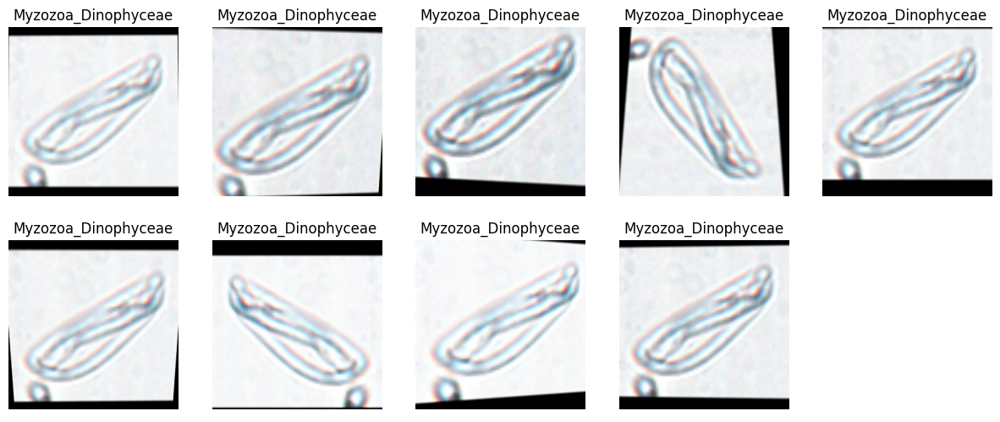

In [9]:
# Show data and check transforms
dls.show_batch(nrows=2, ncols=5, unique=True)

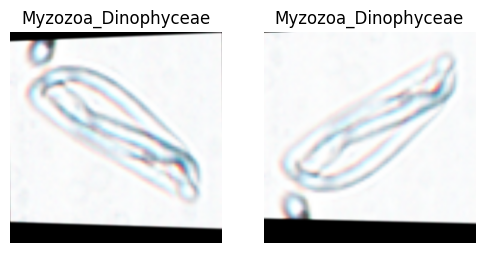

In [10]:
# Show data (= 1 bs) from train set
dls.train.show_batch(max_n=2, nrows=1, unique=True)

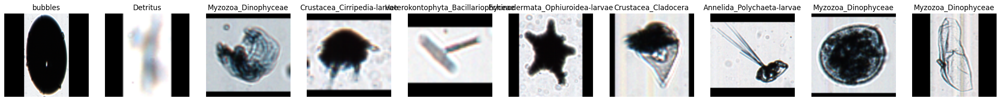

In [11]:
# Show data (= 1 bs) from validation set
dls.valid.show_batch(max_n=10, nrows=1)

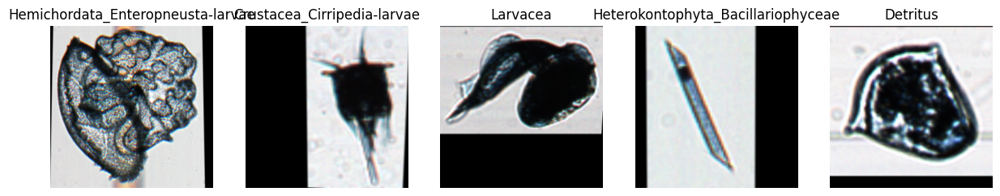

In [12]:
# Show data (= 1 bs) from training
dls.show_batch(nrows=1, ncols=5)

## Train model

In [13]:
# Create Learner
learn = vision_learner(dls, resnet50, #loss_func=Huber(), # different ResNets and Loss functions can be specified here
                    metrics=error_rate
                   ); # creates pretrained model
learn.model = torch.nn.DataParallel(learn.model) # Parallels computations over multiplle GPUs

print('This is Plankton Identifier version: ' + filename) # See top
print('The batchsize is set at:', bs) # See top
print('The loss function is:', learn.loss_func) # Double check current loss func

This is Plankton Identifier version: Plankton_imager_v01
The batchsize is set at: 600
The loss function is: FlattenedLoss of CrossEntropyLoss()


In [14]:
learn.save(filename + '_stage-1_00'); # Saves pretrained model, for repetitive trials

#### Stage 1 (frozen model)

SuggestedLRs(valley=0.0008317637839354575)

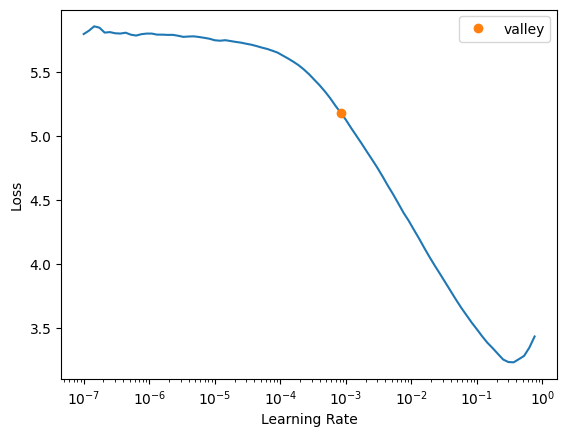

In [15]:
# LR finder for frozen model
learn.lr_find()

In [16]:
%%time

# Fit frozen network (i.e. only last layers), with callbacks
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(9e-3), # specify number of cycles and LR
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,2.355793,1.262595,0.327706,00:49
1,1.496449,0.922245,0.257026,00:49
2,1.114739,0.768890,0.221267,00:49
3,0.916507,0.616870,0.198091,00:49
4,0.768753,0.568710,0.171560,00:49
5,0.650037,0.495439,0.153209,00:48
6,0.571368,0.449299,0.138633,00:48
7,0.507208,0.417814,0.132445,00:49
8,0.465592,0.382006,0.123112,00:49
9,0.427681,0.378526,0.120596,00:49


Better model found at epoch 0 with valid_loss value: 1.2625954151153564.
Better model found at epoch 1 with valid_loss value: 0.9222450852394104.
Better model found at epoch 2 with valid_loss value: 0.7688903212547302.
Better model found at epoch 3 with valid_loss value: 0.6168702244758606.
Better model found at epoch 4 with valid_loss value: 0.5687103271484375.
Better model found at epoch 5 with valid_loss value: 0.49543899297714233.
Better model found at epoch 6 with valid_loss value: 0.4492993950843811.
Better model found at epoch 7 with valid_loss value: 0.417813777923584.
Better model found at epoch 8 with valid_loss value: 0.3820062279701233.
Better model found at epoch 9 with valid_loss value: 0.37852582335472107.
Better model found at epoch 10 with valid_loss value: 0.3492356240749359.
Better model found at epoch 12 with valid_loss value: 0.33835330605506897.
Better model found at epoch 14 with valid_loss value: 0.3383079767227173.
Better model found at epoch 16 with valid_loss

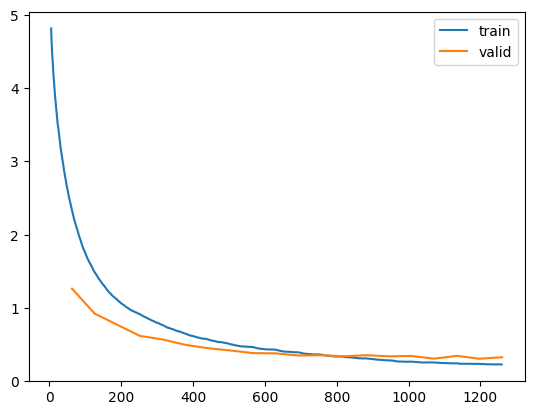

In [17]:
# Save resulting best performing model
learn.load('TempBestModel')
learn.save(filename + '_stage-1_01')
learn.recorder.plot_loss()

In [18]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(9e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.536892,0.856125,0.258914,00:48
1,1.045133,0.692434,0.203020,00:48
2,0.792409,0.531787,0.157613,00:49
3,0.698067,0.515219,0.151741,00:49
4,0.699463,0.658026,0.168100,00:48
5,0.678725,0.414921,0.117135,00:48
6,0.602414,0.409957,0.119337,00:49
7,0.568474,0.397429,0.117659,00:49
8,0.549021,0.418457,0.116296,00:48
9,0.515131,0.438948,0.109585,00:48


Better model found at epoch 0 with valid_loss value: 0.8561251759529114.
Better model found at epoch 1 with valid_loss value: 0.6924338936805725.
Better model found at epoch 2 with valid_loss value: 0.531787097454071.
Better model found at epoch 3 with valid_loss value: 0.5152189135551453.
Better model found at epoch 5 with valid_loss value: 0.4149211645126343.
Better model found at epoch 6 with valid_loss value: 0.4099566340446472.
Better model found at epoch 7 with valid_loss value: 0.39742913842201233.
Better model found at epoch 10 with valid_loss value: 0.3462729752063751.
Better model found at epoch 11 with valid_loss value: 0.3331853747367859.
Better model found at epoch 12 with valid_loss value: 0.2695169448852539.
Better model found at epoch 13 with valid_loss value: 0.2529747486114502.
Better model found at epoch 15 with valid_loss value: 0.223018079996109.
Better model found at epoch 16 with valid_loss value: 0.21408399939537048.
Better model found at epoch 17 with valid_los

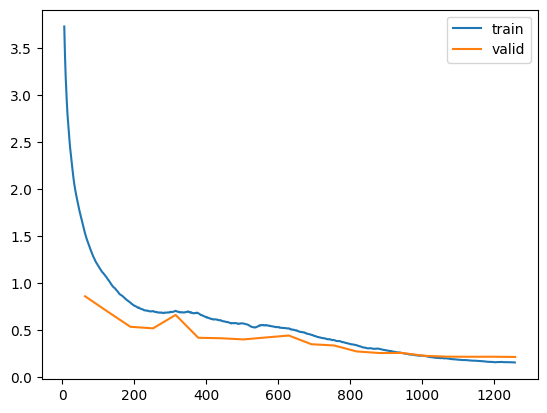

In [19]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_02')
learn.recorder.plot_loss()

In [20]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(6e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.581124,0.980464,0.286179,00:48
1,1.073877,0.793931,0.225357,00:49
2,0.837497,0.547779,0.168624,00:49
3,0.666838,0.478466,0.137689,00:49
4,0.608453,0.503570,0.136640,00:48
5,0.542554,0.368634,0.117345,00:48
6,0.501016,0.387398,0.116611,00:48
7,0.467896,0.365461,0.103607,00:49
8,0.430033,0.356973,0.106229,00:49
9,0.402674,0.334382,0.103293,00:48


Better model found at epoch 0 with valid_loss value: 0.9804636240005493.
Better model found at epoch 1 with valid_loss value: 0.7939309477806091.
Better model found at epoch 2 with valid_loss value: 0.5477785468101501.
Better model found at epoch 3 with valid_loss value: 0.4784659445285797.
Better model found at epoch 5 with valid_loss value: 0.3686337471008301.
Better model found at epoch 7 with valid_loss value: 0.36546117067337036.
Better model found at epoch 8 with valid_loss value: 0.3569730818271637.
Better model found at epoch 9 with valid_loss value: 0.3343815505504608.
Better model found at epoch 10 with valid_loss value: 0.2833586037158966.
Better model found at epoch 11 with valid_loss value: 0.2764221131801605.
Better model found at epoch 12 with valid_loss value: 0.2655179798603058.
Better model found at epoch 13 with valid_loss value: 0.2511850893497467.
Better model found at epoch 14 with valid_loss value: 0.23089225590229034.
Better model found at epoch 15 with valid_lo

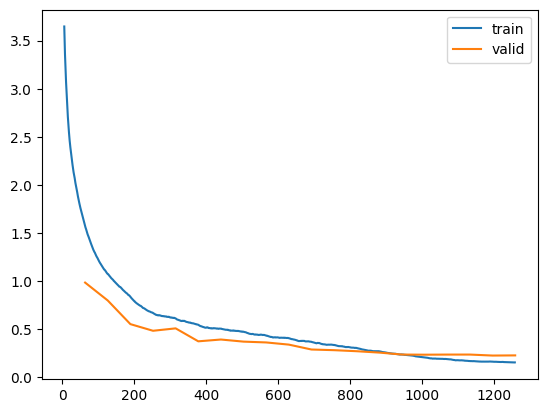

In [21]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_03')
learn.recorder.plot_loss()

In [22]:
%%time 

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(5e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,2.755235,1.472585,0.380138,00:49
1,1.733570,1.023386,0.275273,00:48
2,1.267315,0.873677,0.249266,00:49
3,1.010503,0.729566,0.222106,00:48
4,0.853411,0.659807,0.192114,00:49
5,0.734442,0.552353,0.169883,00:48
6,0.649054,0.524050,0.159291,00:49
7,0.581322,0.505612,0.149853,00:50
8,0.528486,0.434373,0.135696,00:49
9,0.483703,0.440734,0.135801,00:49


Better model found at epoch 0 with valid_loss value: 1.4725853204727173.
Better model found at epoch 1 with valid_loss value: 1.0233862400054932.
Better model found at epoch 2 with valid_loss value: 0.8736773133277893.
Better model found at epoch 3 with valid_loss value: 0.7295657396316528.
Better model found at epoch 4 with valid_loss value: 0.6598073840141296.
Better model found at epoch 5 with valid_loss value: 0.552352786064148.
Better model found at epoch 6 with valid_loss value: 0.524049699306488.
Better model found at epoch 7 with valid_loss value: 0.5056117177009583.
Better model found at epoch 8 with valid_loss value: 0.43437331914901733.
Better model found at epoch 10 with valid_loss value: 0.38766542077064514.
Better model found at epoch 13 with valid_loss value: 0.35588720440864563.
Better model found at epoch 15 with valid_loss value: 0.34649068117141724.
Better model found at epoch 17 with valid_loss value: 0.33265119791030884.
Better model found at epoch 19 with valid_lo

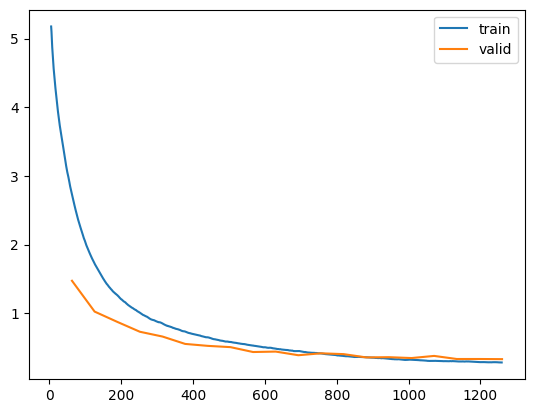

In [23]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_04')
learn.recorder.plot_loss()

In [24]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,2.277272,1.209560,0.318897,00:49
1,1.467459,0.905870,0.254824,00:49
2,1.093174,0.830047,0.227768,00:49
3,0.895358,0.645318,0.198091,00:48
4,0.755929,0.589398,0.167471,00:48
5,0.644123,0.466160,0.151846,00:48
6,0.554074,0.459099,0.138947,00:49
7,0.497765,0.397736,0.124476,00:48
8,0.445966,0.368587,0.120176,00:48
9,0.410483,0.359813,0.113884,00:49


Better model found at epoch 0 with valid_loss value: 1.2095595598220825.
Better model found at epoch 1 with valid_loss value: 0.905870258808136.
Better model found at epoch 2 with valid_loss value: 0.8300471901893616.
Better model found at epoch 3 with valid_loss value: 0.6453181505203247.
Better model found at epoch 4 with valid_loss value: 0.5893982648849487.
Better model found at epoch 5 with valid_loss value: 0.4661600589752197.
Better model found at epoch 6 with valid_loss value: 0.4590992331504822.
Better model found at epoch 7 with valid_loss value: 0.3977360725402832.
Better model found at epoch 8 with valid_loss value: 0.36858659982681274.
Better model found at epoch 9 with valid_loss value: 0.3598128855228424.
Better model found at epoch 10 with valid_loss value: 0.35015869140625.
Better model found at epoch 11 with valid_loss value: 0.3455895185470581.
Better model found at epoch 12 with valid_loss value: 0.32005512714385986.
Better model found at epoch 13 with valid_loss va

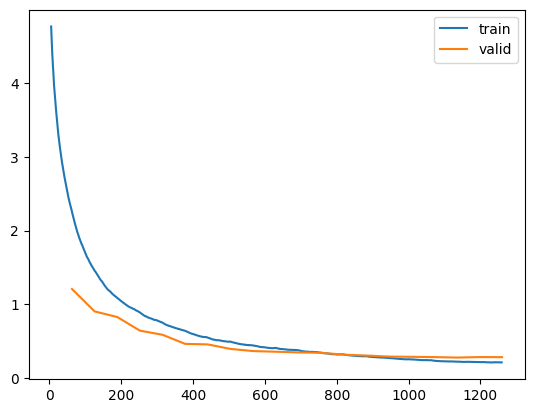

In [25]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_05')
learn.recorder.plot_loss()

In [26]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(50,slice(9e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,2.480410,1.371977,0.361367,00:49
1,1.694785,1.065306,0.284920,00:49
2,1.310139,0.906201,0.254719,00:48
3,1.081970,0.776222,0.224622,00:48
4,0.926322,0.722664,0.211829,00:49
5,0.812032,0.619567,0.190961,00:48
6,0.734708,0.578098,0.179845,00:48
7,0.672760,0.526259,0.161074,00:48
8,0.618657,0.494159,0.150482,00:49
9,0.558072,0.463669,0.148805,00:48


Better model found at epoch 0 with valid_loss value: 1.3719770908355713.
Better model found at epoch 1 with valid_loss value: 1.0653058290481567.
Better model found at epoch 2 with valid_loss value: 0.9062013626098633.
Better model found at epoch 3 with valid_loss value: 0.7762222290039062.
Better model found at epoch 4 with valid_loss value: 0.7226640582084656.
Better model found at epoch 5 with valid_loss value: 0.6195666790008545.
Better model found at epoch 6 with valid_loss value: 0.5780979990959167.
Better model found at epoch 7 with valid_loss value: 0.5262592434883118.
Better model found at epoch 8 with valid_loss value: 0.4941585063934326.
Better model found at epoch 9 with valid_loss value: 0.4636687636375427.
Better model found at epoch 10 with valid_loss value: 0.4197577238082886.
Better model found at epoch 11 with valid_loss value: 0.40051186084747314.
Better model found at epoch 12 with valid_loss value: 0.39869895577430725.
Better model found at epoch 13 with valid_loss

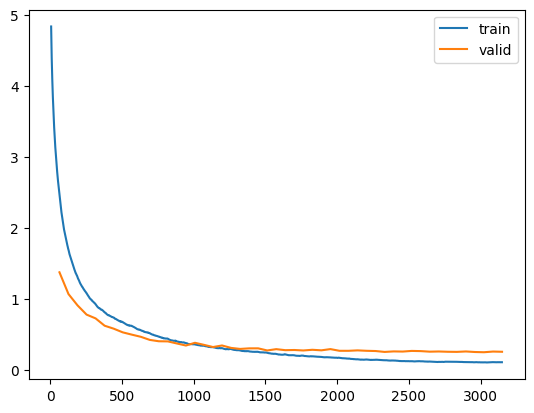

In [27]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_06')
learn.recorder.plot_loss()

In [28]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(50,slice(9e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.588798,0.942324,0.277580,00:49
1,1.076745,0.674449,0.210256,00:48
2,0.855512,0.606648,0.181942,00:48
3,0.720719,0.519434,0.158138,00:48
4,0.620694,0.446024,0.143247,00:48
5,0.545017,0.420504,0.135487,00:48
6,0.528167,0.408615,0.126363,00:48
7,0.535934,0.442166,0.127517,00:49
8,0.550989,0.442565,0.121435,00:49
9,0.628783,0.492160,0.141254,00:48


Better model found at epoch 0 with valid_loss value: 0.9423235058784485.
Better model found at epoch 1 with valid_loss value: 0.6744488477706909.
Better model found at epoch 2 with valid_loss value: 0.6066483855247498.
Better model found at epoch 3 with valid_loss value: 0.5194340944290161.
Better model found at epoch 4 with valid_loss value: 0.44602376222610474.
Better model found at epoch 5 with valid_loss value: 0.4205036759376526.
Better model found at epoch 6 with valid_loss value: 0.4086145758628845.
Better model found at epoch 18 with valid_loss value: 0.4019545018672943.
Better model found at epoch 19 with valid_loss value: 0.38025081157684326.
Better model found at epoch 23 with valid_loss value: 0.37049344182014465.
Better model found at epoch 24 with valid_loss value: 0.34512606263160706.
Better model found at epoch 26 with valid_loss value: 0.32721465826034546.
Better model found at epoch 27 with valid_loss value: 0.31471142172813416.
Better model found at epoch 30 with val

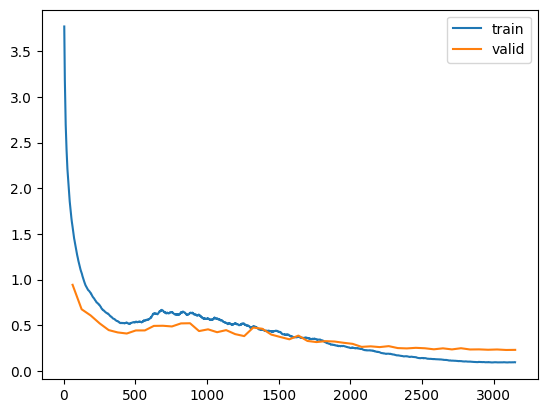

In [29]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_07')
learn.recorder.plot_loss()

In [30]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(50,slice(6e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.658258,0.955031,0.280935,00:49
1,1.126576,0.739690,0.222106,00:49
2,0.885541,0.671560,0.193058,00:49
3,0.771266,0.574125,0.162857,00:48
4,0.673824,0.478330,0.145449,00:49
5,0.572787,0.476250,0.145973,00:48
6,0.515609,0.411449,0.123742,00:49
7,0.493691,0.434022,0.127517,00:48
8,0.482051,0.438137,0.122693,00:50
9,0.485641,0.424524,0.119966,00:48


Better model found at epoch 0 with valid_loss value: 0.9550312161445618.
Better model found at epoch 1 with valid_loss value: 0.7396899461746216.
Better model found at epoch 2 with valid_loss value: 0.6715596914291382.
Better model found at epoch 3 with valid_loss value: 0.5741252899169922.
Better model found at epoch 4 with valid_loss value: 0.4783303737640381.
Better model found at epoch 5 with valid_loss value: 0.476249635219574.
Better model found at epoch 6 with valid_loss value: 0.41144877672195435.
Better model found at epoch 10 with valid_loss value: 0.3812330961227417.
Better model found at epoch 12 with valid_loss value: 0.36072641611099243.
Better model found at epoch 15 with valid_loss value: 0.35029563307762146.
Better model found at epoch 16 with valid_loss value: 0.3249491751194.
Better model found at epoch 20 with valid_loss value: 0.3156895637512207.
Better model found at epoch 21 with valid_loss value: 0.2888740003108978.
Better model found at epoch 24 with valid_loss

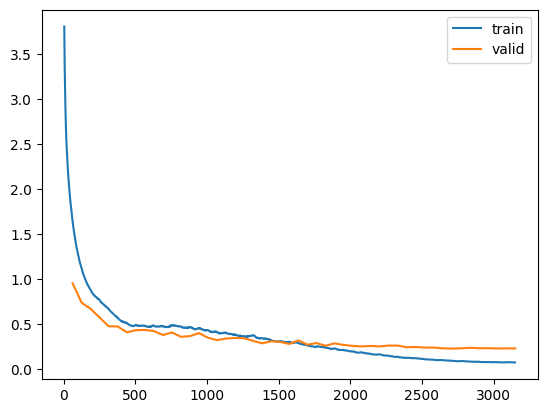

In [31]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_08')
learn.recorder.plot_loss()

In [32]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(4e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,4.829390,3.210852,0.733431,00:49
1,3.595232,2.038733,0.499056,00:49
2,2.590103,1.425302,0.371959,00:48
3,1.952392,1.188794,0.311661,00:50
4,1.572858,0.997981,0.276741,00:50
5,1.349155,0.913589,0.255872,00:49
6,1.198571,0.828460,0.241086,00:49
7,1.090766,0.773126,0.228398,00:49
8,1.007137,0.783805,0.224937,00:50
9,0.953470,0.712493,0.212248,00:49


Better model found at epoch 0 with valid_loss value: 3.2108523845672607.
Better model found at epoch 1 with valid_loss value: 2.0387330055236816.
Better model found at epoch 2 with valid_loss value: 1.425302267074585.
Better model found at epoch 3 with valid_loss value: 1.1887938976287842.
Better model found at epoch 4 with valid_loss value: 0.9979805946350098.
Better model found at epoch 5 with valid_loss value: 0.9135890603065491.
Better model found at epoch 6 with valid_loss value: 0.8284597992897034.
Better model found at epoch 7 with valid_loss value: 0.7731258869171143.
Better model found at epoch 9 with valid_loss value: 0.7124931216239929.
Better model found at epoch 10 with valid_loss value: 0.7093328833580017.
Better model found at epoch 11 with valid_loss value: 0.6645547747612.
Better model found at epoch 13 with valid_loss value: 0.6612966060638428.
Better model found at epoch 14 with valid_loss value: 0.6389265060424805.
Better model found at epoch 15 with valid_loss valu

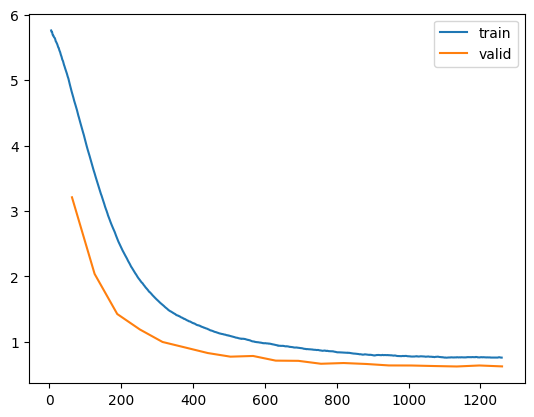

In [33]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_09')
learn.recorder.plot_loss()

In [34]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(7e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,4.420592,2.753686,0.637584,00:48
1,3.089291,1.688200,0.429635,00:50
2,2.174736,1.240942,0.328335,00:49
3,1.644295,1.014859,0.276741,00:49
4,1.332087,0.896853,0.249476,00:49
5,1.144537,0.825239,0.231963,00:48
6,1.014453,0.745940,0.219694,00:49
7,0.930975,0.752664,0.211305,00:48
8,0.858621,0.658750,0.202076,00:50
9,0.812847,0.661083,0.196623,00:48


Better model found at epoch 0 with valid_loss value: 2.7536861896514893.
Better model found at epoch 1 with valid_loss value: 1.6881999969482422.
Better model found at epoch 2 with valid_loss value: 1.2409420013427734.
Better model found at epoch 3 with valid_loss value: 1.0148591995239258.
Better model found at epoch 4 with valid_loss value: 0.8968528509140015.
Better model found at epoch 5 with valid_loss value: 0.8252387046813965.
Better model found at epoch 6 with valid_loss value: 0.7459395527839661.
Better model found at epoch 8 with valid_loss value: 0.6587496995925903.
Better model found at epoch 10 with valid_loss value: 0.6346554160118103.
Better model found at epoch 11 with valid_loss value: 0.6174110174179077.
Better model found at epoch 12 with valid_loss value: 0.6028474569320679.
Better model found at epoch 13 with valid_loss value: 0.5855848789215088.
Better model found at epoch 15 with valid_loss value: 0.5589576959609985.
Better model found at epoch 16 with valid_loss

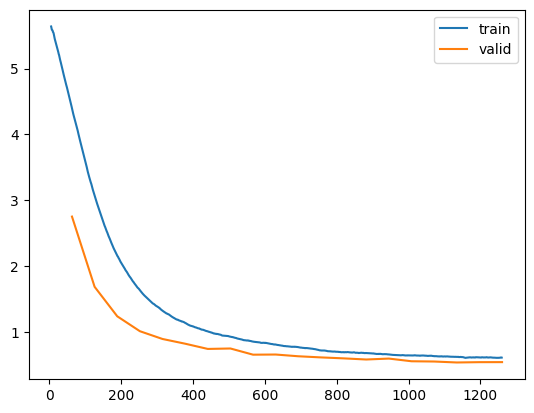

In [35]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_10')
learn.recorder.plot_loss()

The above two steps can be repeated any number of times, until the performance is satisfactory

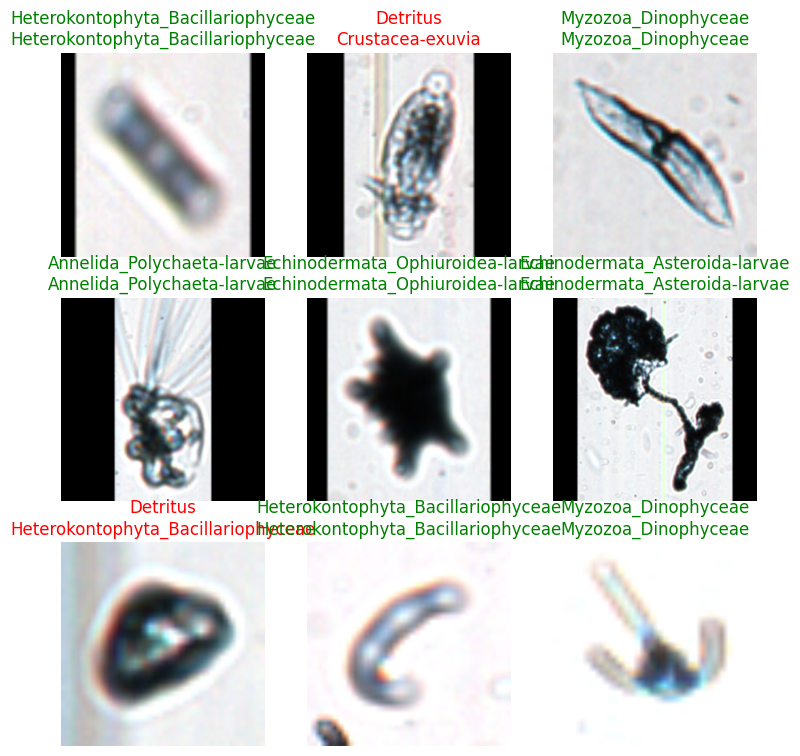

In [36]:
# Select best stage-1 model, save and show results
learn.load(filename + '_stage-1_02') # Manually select best stage 1 model
learn.save(filename + '_stage-1_Best')
learn.show_results()

#### Stage_2 (unfrozen model)

In [37]:
# Load best performing Stage_1 model
learn.load(filename + '_stage-1_Best')
learn.unfreeze()

SuggestedLRs(valley=9.120108734350652e-05)

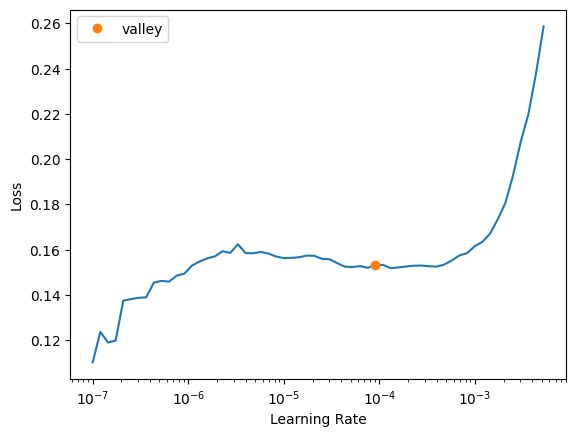

In [38]:
# LR finder for unfrozen model 
learn.lr_find()

In [39]:
%%time

# Fit unfrozen network (i.e. all layers), with callbacks
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(1e-6,1e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.149257,0.211569,0.070575,00:56
1,0.151914,0.209826,0.069841,00:56
2,0.148590,0.209244,0.068058,00:56
3,0.152497,0.209740,0.069316,00:55
4,0.149741,0.208561,0.067953,00:55
5,0.145125,0.205891,0.067114,00:56
6,0.143748,0.206657,0.067009,00:55
7,0.141284,0.206108,0.065122,00:56
8,0.139310,0.206281,0.066485,00:56
9,0.136628,0.204714,0.066275,00:56


Better model found at epoch 0 with valid_loss value: 0.21156948804855347.
Better model found at epoch 1 with valid_loss value: 0.20982620120048523.
Better model found at epoch 2 with valid_loss value: 0.20924416184425354.
Better model found at epoch 4 with valid_loss value: 0.2085610330104828.
Better model found at epoch 5 with valid_loss value: 0.20589084923267365.
Better model found at epoch 9 with valid_loss value: 0.2047138661146164.
Better model found at epoch 13 with valid_loss value: 0.20426054298877716.
Better model found at epoch 15 with valid_loss value: 0.20360969007015228.
Better model found at epoch 16 with valid_loss value: 0.20351797342300415.
CPU times: user 12min 29s, sys: 6min, total: 18min 29s
Wall time: 18min 45s


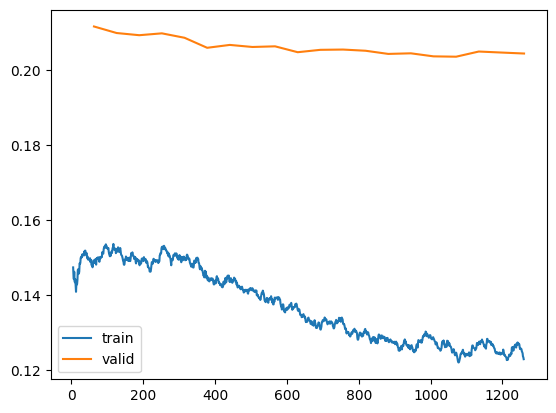

In [40]:
# Save resulting best performing model
learn.load('TempBestModel')
learn.save(filename + '_stage-2_01')
learn.recorder.plot_loss()

In [41]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(3e-6,3e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.152278,0.209668,0.068477,00:55
1,0.149993,0.210178,0.067638,00:55
2,0.150381,0.206779,0.067114,00:55
3,0.149508,0.209785,0.067429,00:55
4,0.144601,0.207608,0.066799,00:55
5,0.137822,0.204617,0.065856,00:55
6,0.133554,0.206870,0.065646,00:56
7,0.127510,0.204304,0.065961,00:56
8,0.123595,0.201914,0.065751,00:55
9,0.116734,0.205854,0.066904,00:57


Better model found at epoch 0 with valid_loss value: 0.2096683531999588.
Better model found at epoch 2 with valid_loss value: 0.20677858591079712.
Better model found at epoch 5 with valid_loss value: 0.20461668074131012.
Better model found at epoch 7 with valid_loss value: 0.20430409908294678.
Better model found at epoch 8 with valid_loss value: 0.2019137293100357.
CPU times: user 12min 26s, sys: 6min 1s, total: 18min 28s
Wall time: 18min 44s


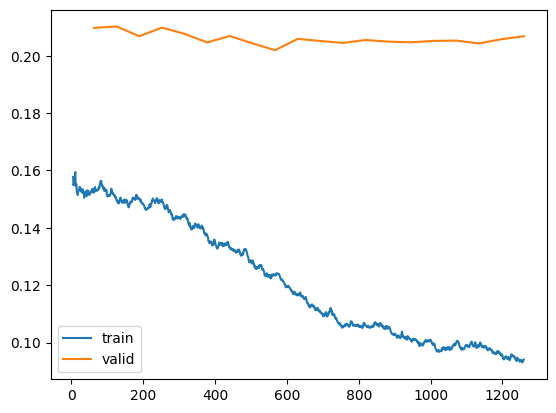

In [42]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_02')
learn.recorder.plot_loss()

In [43]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(3e-5,3e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.155271,0.212797,0.068268,00:55
1,0.159343,0.223366,0.070155,00:55
2,0.165721,0.237829,0.075294,00:55
3,0.177877,0.234983,0.074874,00:55
4,0.187519,0.238530,0.075713,00:54
5,0.176962,0.236295,0.074350,00:55
6,0.163671,0.231833,0.073930,00:57
7,0.148361,0.210695,0.068268,00:55
8,0.134649,0.218965,0.072043,00:55
9,0.118843,0.234613,0.072043,00:55


Better model found at epoch 0 with valid_loss value: 0.21279731392860413.
Better model found at epoch 7 with valid_loss value: 0.2106953114271164.
CPU times: user 12min 26s, sys: 6min 2s, total: 18min 28s
Wall time: 18min 38s


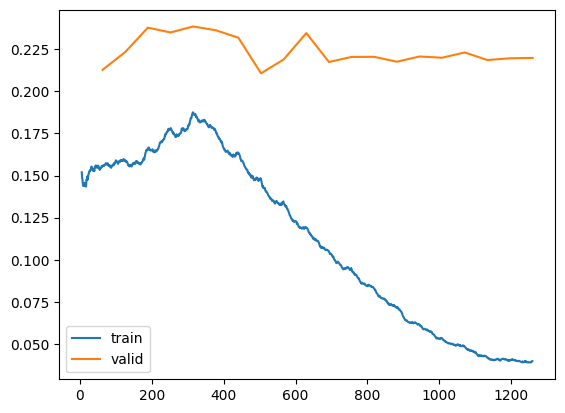

In [44]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_03')
learn.recorder.plot_loss()

In [45]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(3e-7,3e-5), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.153595,0.211049,0.069631,00:55
1,0.151119,0.211199,0.069421,00:56
2,0.149094,0.209884,0.069316,00:56
3,0.152910,0.210888,0.068897,00:55
4,0.152321,0.210277,0.068792,00:55
5,0.149928,0.209873,0.069631,00:55
6,0.147163,0.208911,0.069107,00:55
7,0.148669,0.208860,0.068372,00:55
8,0.144362,0.210623,0.068687,00:56
9,0.147382,0.207995,0.068058,00:55


Better model found at epoch 0 with valid_loss value: 0.21104875206947327.
Better model found at epoch 2 with valid_loss value: 0.20988363027572632.
Better model found at epoch 5 with valid_loss value: 0.20987269282341003.
Better model found at epoch 6 with valid_loss value: 0.20891103148460388.
Better model found at epoch 7 with valid_loss value: 0.20885951817035675.
Better model found at epoch 9 with valid_loss value: 0.20799477398395538.
Better model found at epoch 10 with valid_loss value: 0.20758949220180511.
Better model found at epoch 12 with valid_loss value: 0.20750349760055542.
Better model found at epoch 14 with valid_loss value: 0.20740032196044922.
Better model found at epoch 15 with valid_loss value: 0.20733976364135742.
Better model found at epoch 16 with valid_loss value: 0.20706194639205933.
CPU times: user 12min 27s, sys: 6min 3s, total: 18min 31s
Wall time: 18min 42s


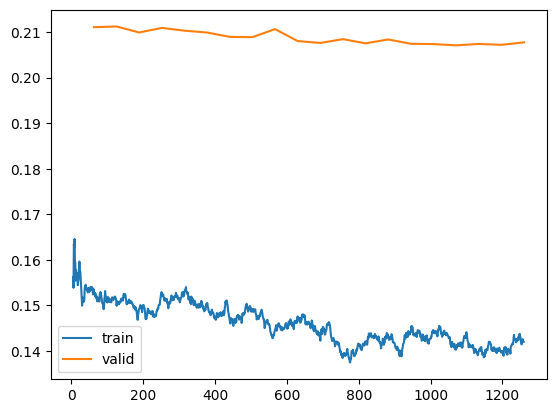

In [46]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_04')
learn.recorder.plot_loss()

In [47]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(10,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.289665,0.638460,0.189597,00:56
1,0.428372,0.718352,0.225461,00:55
2,0.409292,0.453633,0.149014,00:56
3,0.363467,0.436053,0.147651,00:56
4,0.318905,0.346243,0.113989,00:55
5,0.270536,0.313896,0.103607,00:55
6,0.223068,0.224664,0.074035,00:55
7,0.181738,0.193726,0.065541,00:55
8,0.144463,0.179154,0.058096,00:56
9,0.123849,0.178603,0.059039,00:55


Better model found at epoch 0 with valid_loss value: 0.6384596824645996.
Better model found at epoch 2 with valid_loss value: 0.4536330997943878.
Better model found at epoch 3 with valid_loss value: 0.4360528588294983.
Better model found at epoch 4 with valid_loss value: 0.34624308347702026.
Better model found at epoch 5 with valid_loss value: 0.3138956129550934.
Better model found at epoch 6 with valid_loss value: 0.22466382384300232.
Better model found at epoch 7 with valid_loss value: 0.1937258243560791.
Better model found at epoch 8 with valid_loss value: 0.17915396392345428.
Better model found at epoch 9 with valid_loss value: 0.1786026805639267.
CPU times: user 6min 15s, sys: 3min 2s, total: 9min 17s
Wall time: 9min 23s


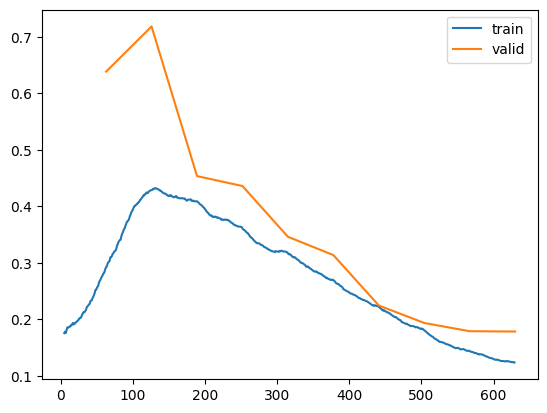

In [48]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_05')
learn.recorder.plot_loss()

In [49]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.216898,0.279162,0.083263,00:55
1,0.290786,0.451529,0.147546,00:55
2,0.360552,0.515871,0.163381,00:55
3,0.373478,0.796582,0.255872,00:55
4,0.366783,0.411513,0.137060,00:56
5,0.342211,0.449471,0.146078,00:56
6,0.322653,0.421418,0.139786,00:56
7,0.293232,0.636734,0.211724,00:55
8,0.270202,0.609168,0.193687,00:56
9,0.251920,0.341380,0.114409,00:55


Better model found at epoch 0 with valid_loss value: 0.2791619598865509.
Better model found at epoch 11 with valid_loss value: 0.24847665429115295.
Better model found at epoch 12 with valid_loss value: 0.24503710865974426.
Better model found at epoch 13 with valid_loss value: 0.2190646231174469.
Better model found at epoch 14 with valid_loss value: 0.2032046765089035.
Better model found at epoch 15 with valid_loss value: 0.19500266015529633.
Better model found at epoch 17 with valid_loss value: 0.1900748610496521.
Better model found at epoch 18 with valid_loss value: 0.18509776890277863.
CPU times: user 12min 28s, sys: 6min 1s, total: 18min 29s
Wall time: 18min 40s


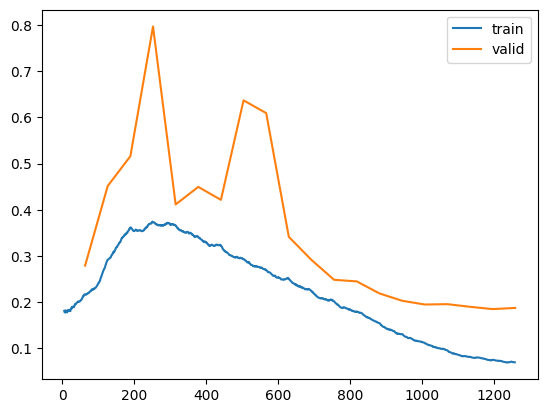

In [50]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_06')
learn.recorder.plot_loss()

In [51]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(10,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.294453,0.723812,0.171665,00:55
1,0.422682,0.898665,0.266149,00:57
2,0.408381,0.433972,0.139052,00:56
3,0.361863,0.473570,0.159711,00:56
4,0.315959,0.303703,0.104027,00:55
5,0.273139,0.316116,0.104551,00:55
6,0.228468,0.242488,0.076657,00:55
7,0.181904,0.206081,0.065646,00:55
8,0.146503,0.182045,0.060403,00:55
9,0.125231,0.181225,0.059878,00:55


Better model found at epoch 0 with valid_loss value: 0.7238117456436157.
Better model found at epoch 2 with valid_loss value: 0.43397223949432373.
Better model found at epoch 4 with valid_loss value: 0.3037032186985016.
Better model found at epoch 6 with valid_loss value: 0.2424880713224411.
Better model found at epoch 7 with valid_loss value: 0.20608071982860565.
Better model found at epoch 8 with valid_loss value: 0.1820453405380249.
Better model found at epoch 9 with valid_loss value: 0.18122504651546478.
CPU times: user 6min 13s, sys: 3min 1s, total: 9min 14s
Wall time: 9min 21s


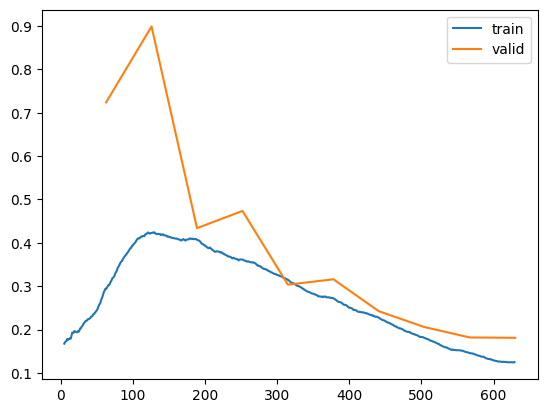

In [52]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_07')
learn.recorder.plot_loss()

In [53]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(50,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.201439,0.245631,0.079383,00:54
1,0.193652,0.250624,0.077706,00:55
2,0.211811,0.293257,0.095113,00:55
3,0.248516,0.317699,0.098784,00:56
4,0.264208,0.379525,0.128146,00:55
5,0.290661,0.373492,0.120805,00:55
6,0.303484,0.492159,0.158138,00:56
7,0.305446,0.450475,0.142513,00:56
8,0.315030,0.456488,0.149224,00:57
9,0.302729,0.611970,0.190961,00:56


Better model found at epoch 0 with valid_loss value: 0.2456311732530594.
Better model found at epoch 27 with valid_loss value: 0.2409641593694687.
Better model found at epoch 30 with valid_loss value: 0.23730993270874023.
Better model found at epoch 34 with valid_loss value: 0.23678873479366302.
Better model found at epoch 35 with valid_loss value: 0.23639164865016937.
Better model found at epoch 37 with valid_loss value: 0.23207007348537445.
CPU times: user 31min 7s, sys: 14min 59s, total: 46min 6s
Wall time: 46min 34s


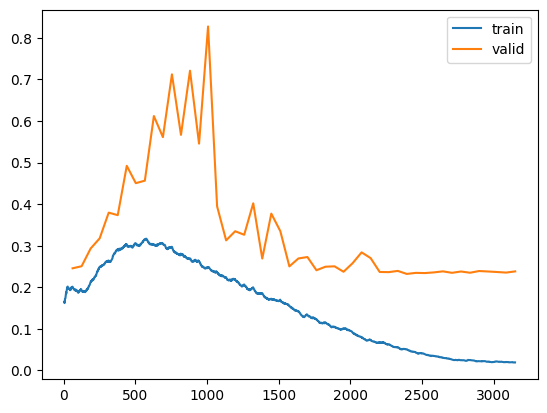

In [54]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_08')
learn.recorder.plot_loss()

In [55]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.220347,0.273385,0.086724,00:56
1,0.289115,0.465554,0.145449,00:55
2,0.352961,0.461223,0.148909,00:55
3,0.378449,0.478986,0.148280,00:56
4,0.361837,0.475430,0.159291,00:56
5,0.342924,0.520947,0.166212,00:55
6,0.317874,0.563841,0.180159,00:54
7,0.291712,0.524759,0.170407,00:56
8,0.275728,0.337438,0.109060,00:55
9,0.261413,0.432001,0.146707,00:55


Better model found at epoch 0 with valid_loss value: 0.27338486909866333.
Better model found at epoch 10 with valid_loss value: 0.2636779248714447.
Better model found at epoch 12 with valid_loss value: 0.23984399437904358.
Better model found at epoch 13 with valid_loss value: 0.23464402556419373.
Better model found at epoch 14 with valid_loss value: 0.19033251702785492.
Better model found at epoch 16 with valid_loss value: 0.18804007768630981.
Better model found at epoch 17 with valid_loss value: 0.18552038073539734.
Better model found at epoch 18 with valid_loss value: 0.18508628010749817.
Better model found at epoch 19 with valid_loss value: 0.18418167531490326.
CPU times: user 12min 27s, sys: 6min 1s, total: 18min 29s
Wall time: 18min 36s


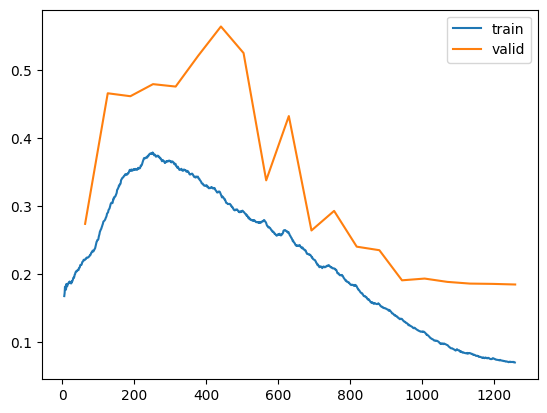

In [56]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_09')
learn.recorder.plot_loss()

In [57]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(50,slice(3e-7,3e-5), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.150782,0.211535,0.069841,00:54
1,0.152469,0.211226,0.068477,00:55
2,0.149397,0.210830,0.069526,00:55
3,0.152522,0.211010,0.068687,00:55
4,0.151634,0.210384,0.068372,00:55
5,0.148619,0.211350,0.068792,00:55
6,0.150271,0.210447,0.068477,00:55
7,0.148426,0.210687,0.069421,00:55
8,0.147411,0.210283,0.067324,00:55
9,0.145281,0.210017,0.069945,00:55


Better model found at epoch 0 with valid_loss value: 0.2115352749824524.
Better model found at epoch 1 with valid_loss value: 0.21122628450393677.
Better model found at epoch 2 with valid_loss value: 0.21083007752895355.
Better model found at epoch 4 with valid_loss value: 0.21038426458835602.
Better model found at epoch 8 with valid_loss value: 0.21028314530849457.
Better model found at epoch 9 with valid_loss value: 0.2100169062614441.
Better model found at epoch 11 with valid_loss value: 0.20972828567028046.
Better model found at epoch 13 with valid_loss value: 0.20877155661582947.
Better model found at epoch 14 with valid_loss value: 0.20829032361507416.
Better model found at epoch 16 with valid_loss value: 0.20787017047405243.
Better model found at epoch 17 with valid_loss value: 0.20661066472530365.
Better model found at epoch 19 with valid_loss value: 0.2064313441514969.
Better model found at epoch 20 with valid_loss value: 0.20587626099586487.
Better model found at epoch 22 wit

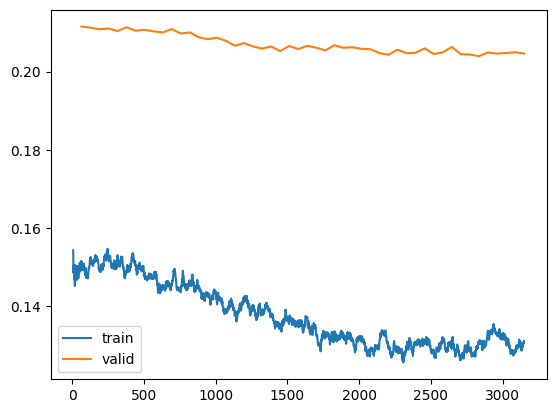

In [58]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_10')
learn.recorder.plot_loss()

The above two steps can be repeated any number of times, until the performance is satisfactory

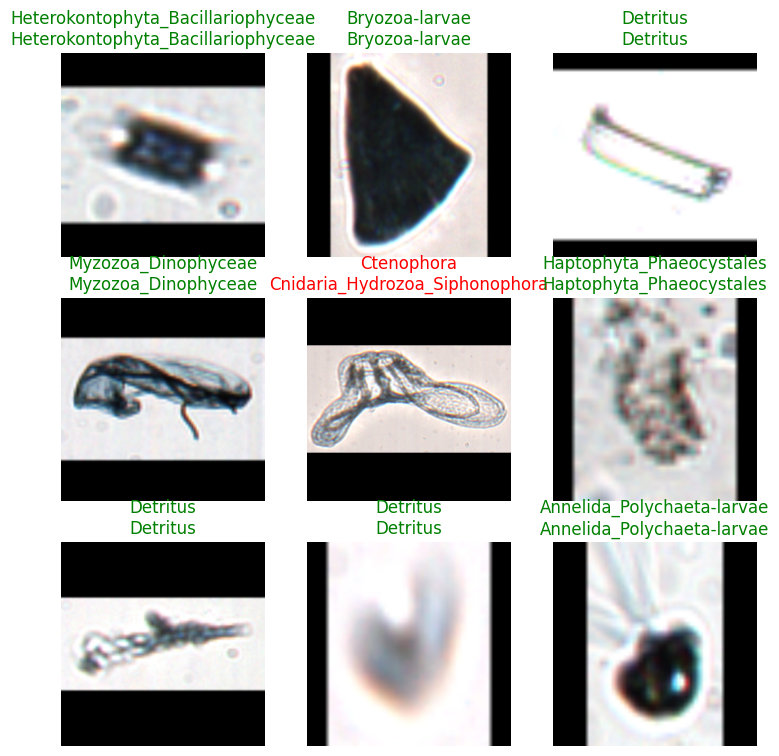

In [59]:
# Select best stage-2 model, save and show results
learn.load(filename + '_stage-2_05') # select best stage 2 model
learn.save(filename + '_stage-2_Best') 
learn.show_results()

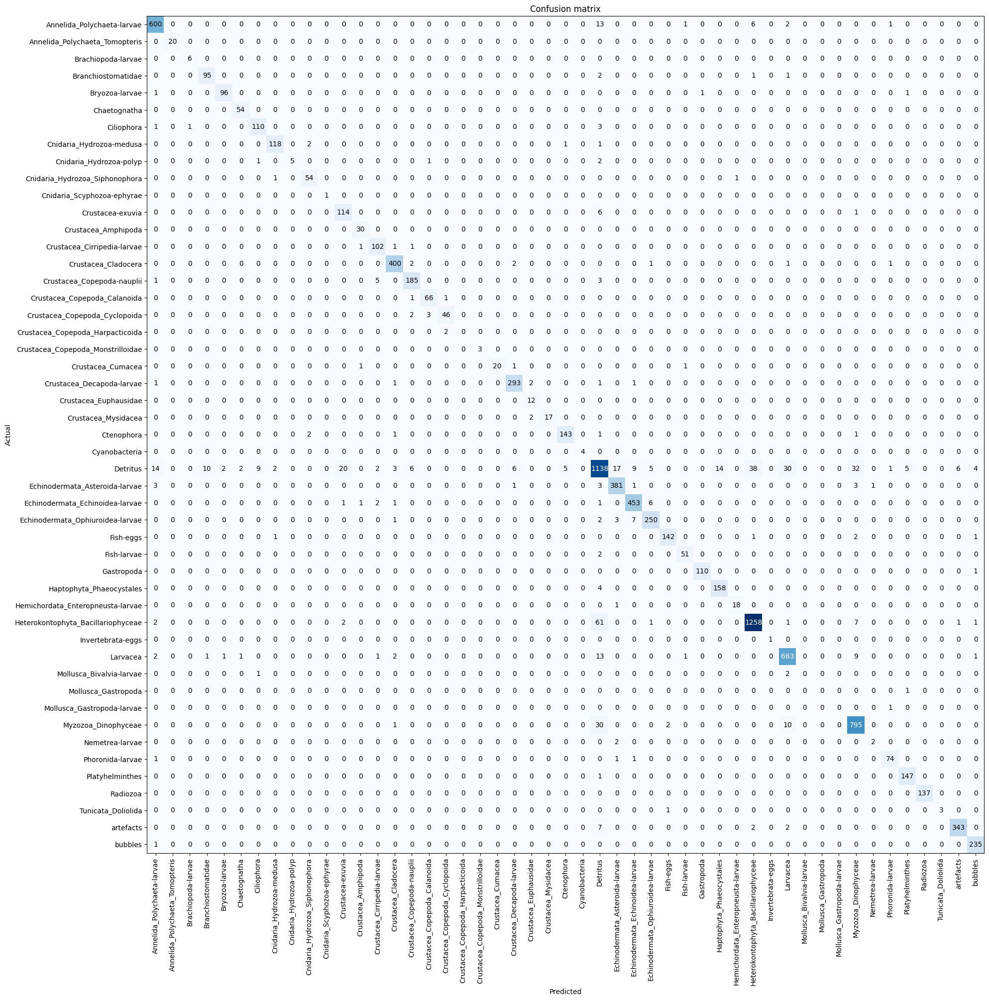

In [60]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(20, 20))

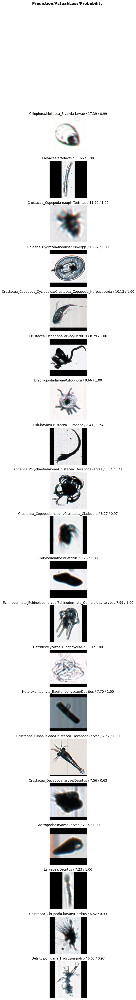

In [61]:
interp.plot_top_losses(20, nrows=20)

In [62]:
interp.most_confused(min_val=2) #p204 book

[('Heterokontophyta_Bacillariophyceae', 'Detritus', 61),
 ('Detritus', 'Heterokontophyta_Bacillariophyceae', 38),
 ('Detritus', 'Myzozoa_Dinophyceae', 32),
 ('Detritus', 'Larvacea', 30),
 ('Myzozoa_Dinophyceae', 'Detritus', 30),
 ('Detritus', 'Crustacea-exuvia', 20),
 ('Detritus', 'Echinodermata_Asteroida-larvae', 17),
 ('Detritus', 'Annelida_Polychaeta-larvae', 14),
 ('Detritus', 'Haptophyta_Phaeocystales', 14),
 ('Annelida_Polychaeta-larvae', 'Detritus', 13),
 ('Larvacea', 'Detritus', 13),
 ('Detritus', 'Branchiostomatidae', 10),
 ('Myzozoa_Dinophyceae', 'Larvacea', 10),
 ('Detritus', 'Ciliophora', 9),
 ('Detritus', 'Echinodermata_Echinoidea-larvae', 9),
 ('Larvacea', 'Myzozoa_Dinophyceae', 9),
 ('Echinodermata_Ophiuroidea-larvae', 'Echinodermata_Echinoidea-larvae', 7),
 ('Heterokontophyta_Bacillariophyceae', 'Myzozoa_Dinophyceae', 7),
 ('artefacts', 'Detritus', 7),
 ('Annelida_Polychaeta-larvae', 'Heterokontophyta_Bacillariophyceae', 6),
 ('Crustacea-exuvia', 'Detritus', 6),
 ('Detr

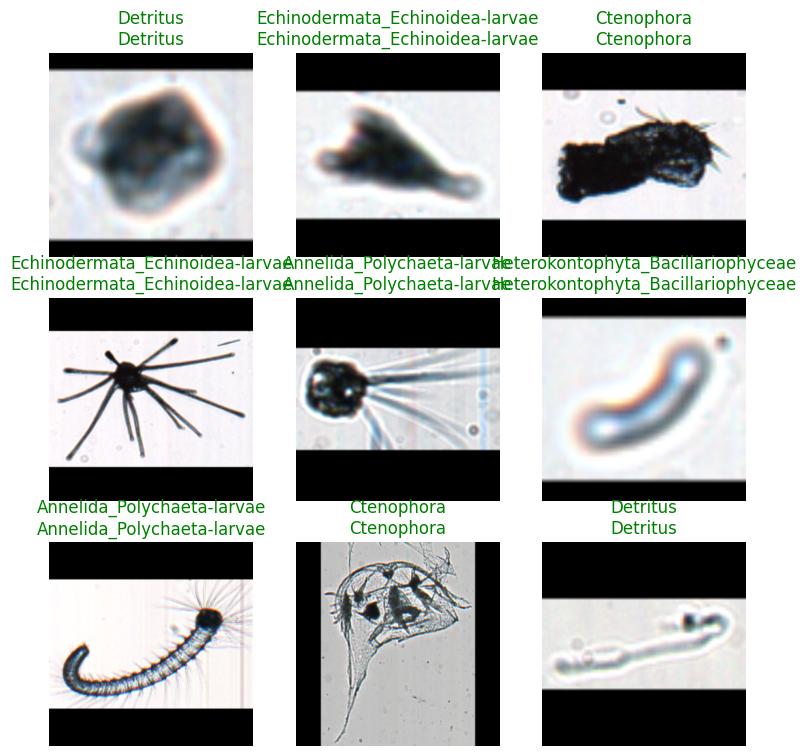

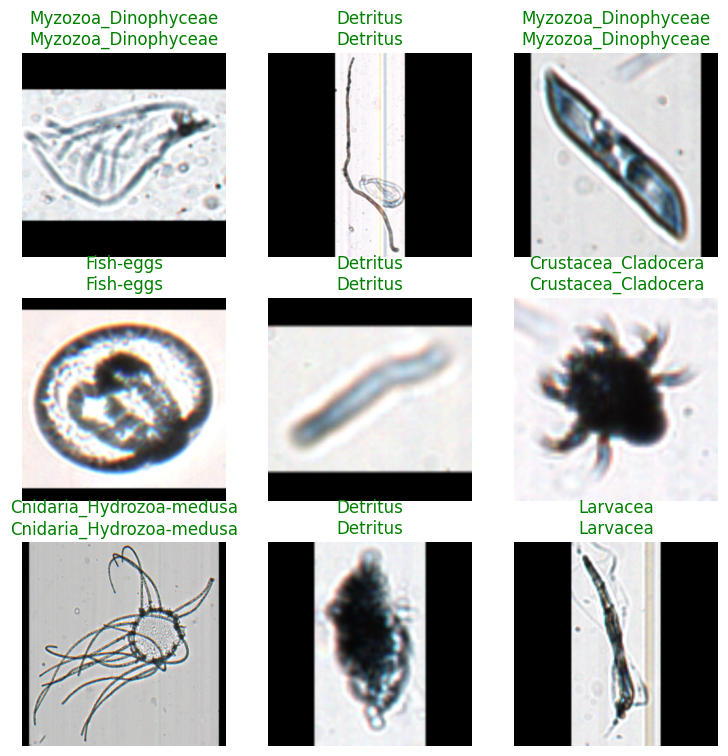

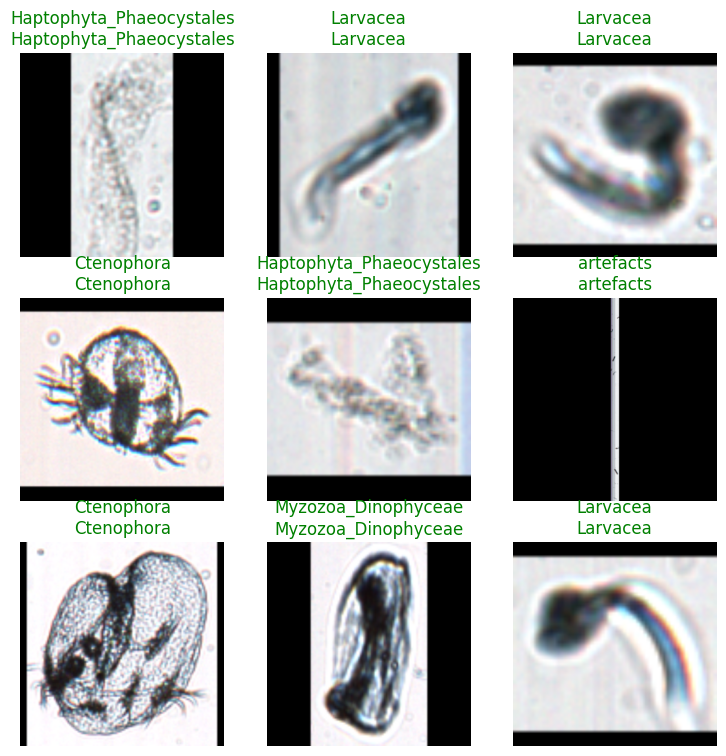

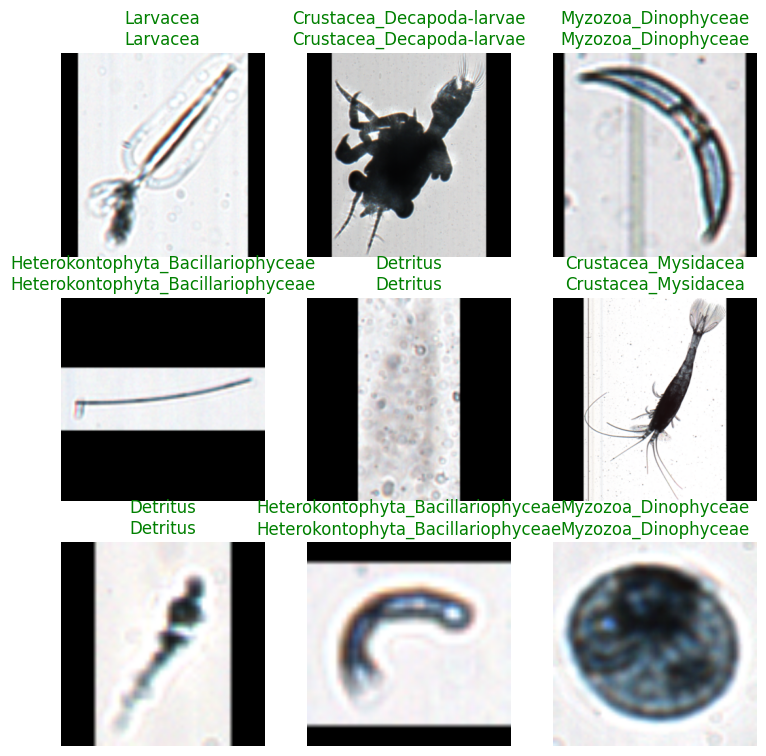

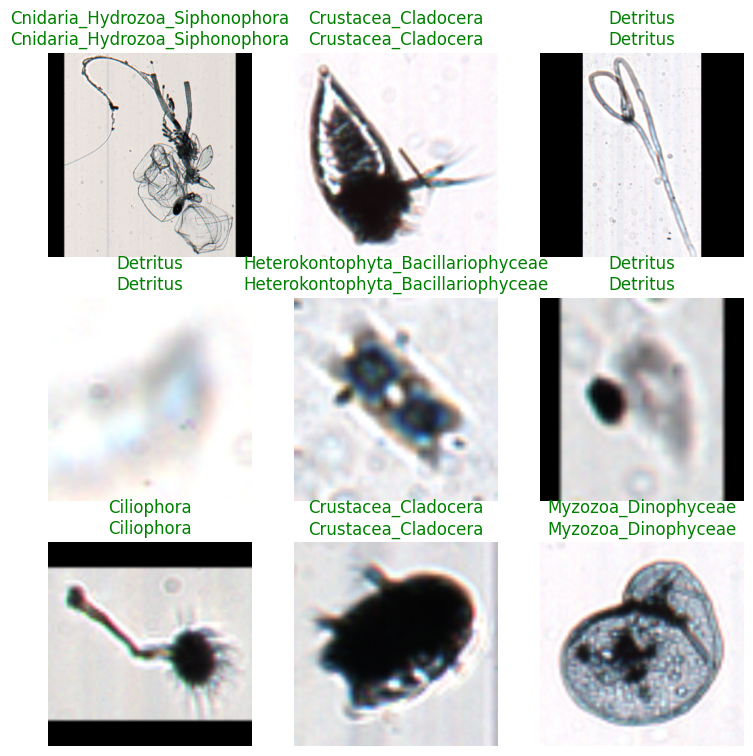

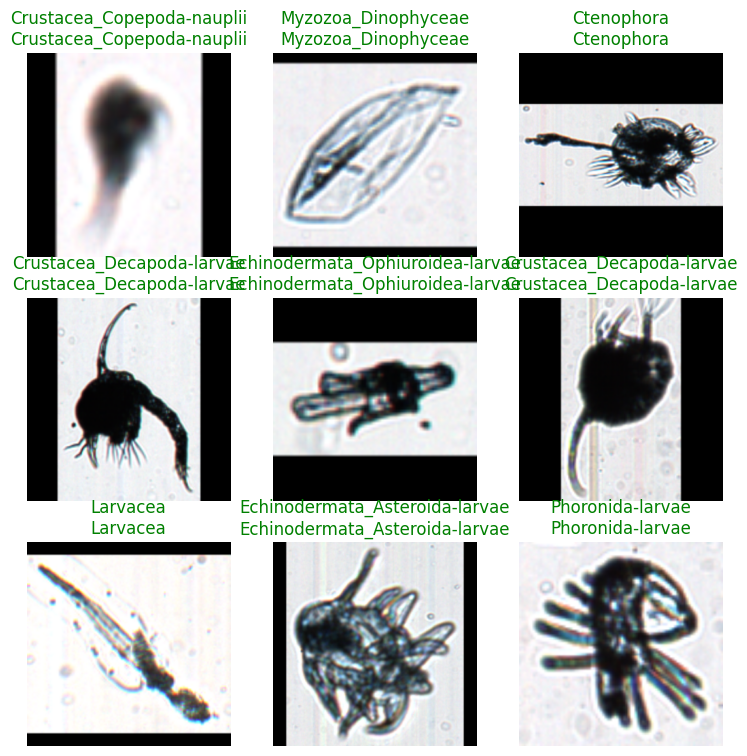

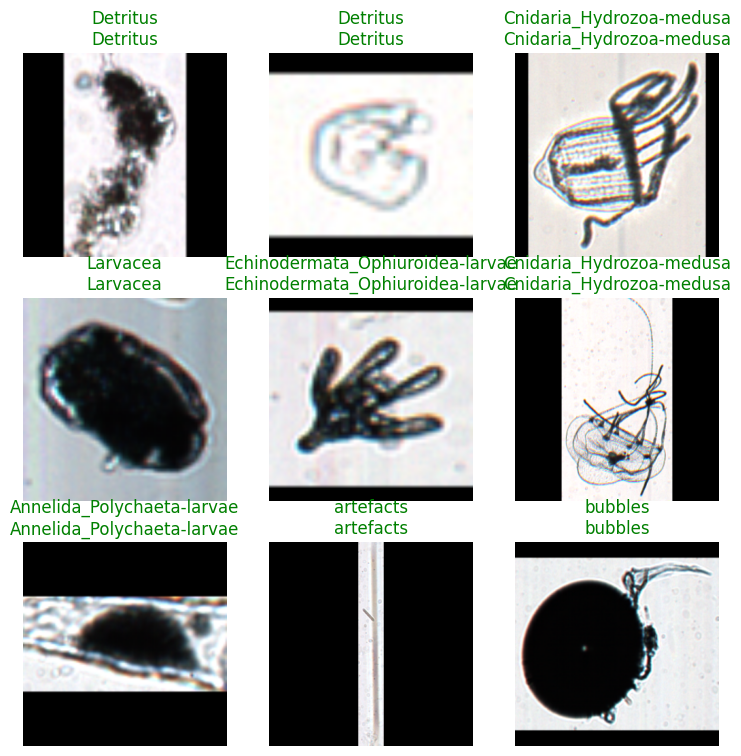

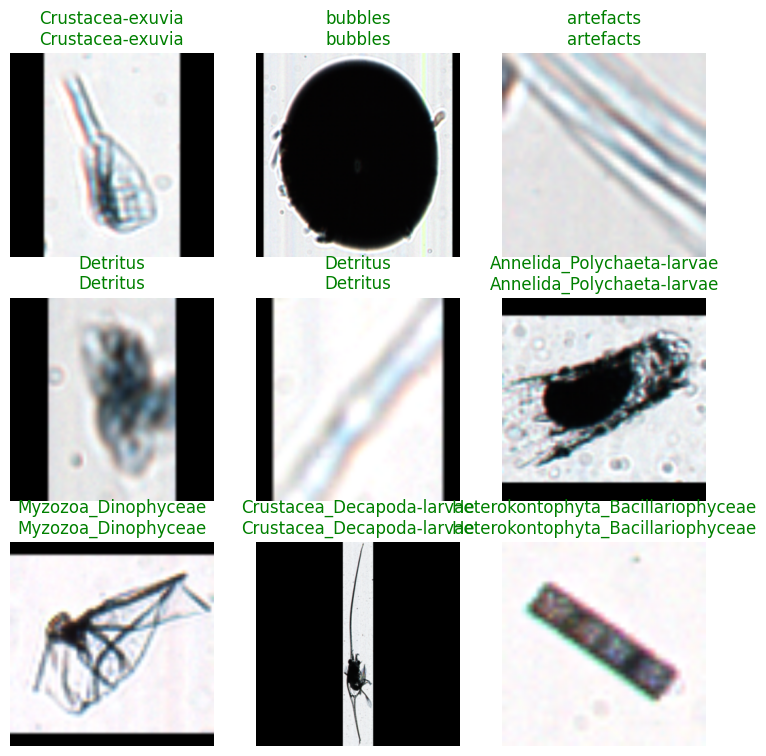

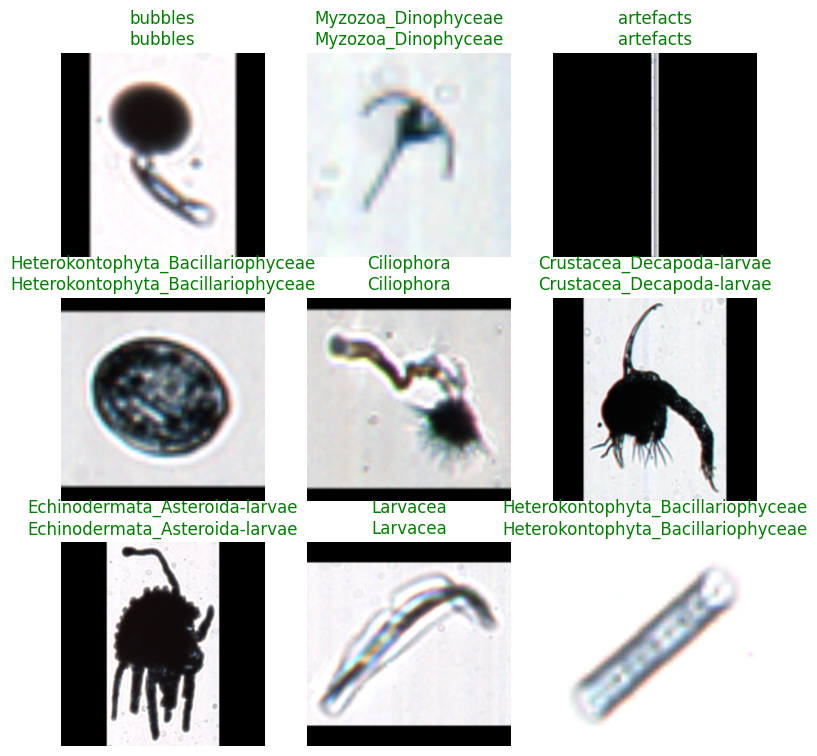

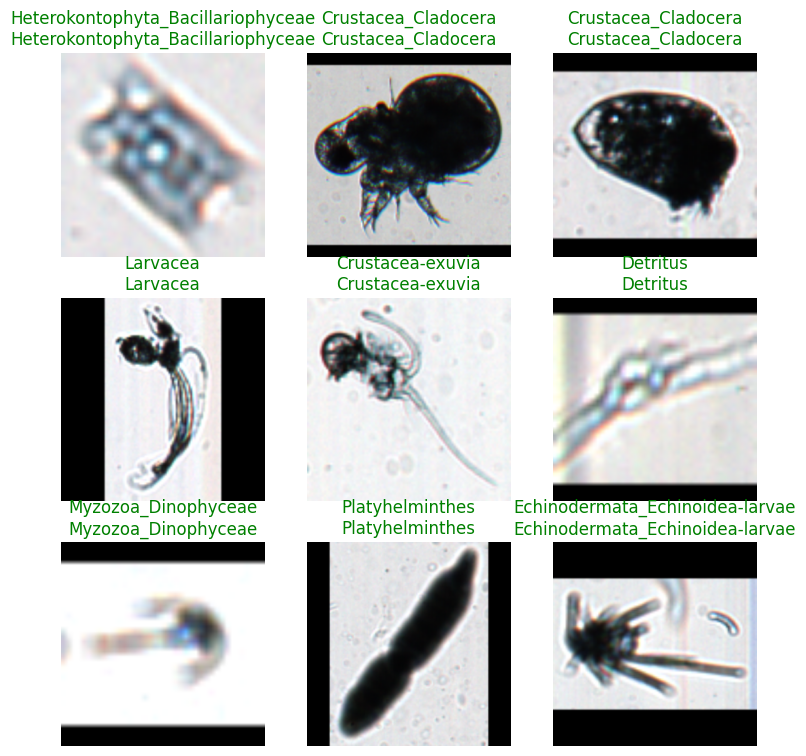

In [63]:
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()

In [54]:
# Some CUDA/GPU tests

def check_all_cuda_devices():
    device_count = torch.cuda.device_count()
    for i in range(device_count):
        print('>>>> torch.cuda.device({})'.format(i))
        result = torch.cuda.device(i)
        print(result, '\n')

        print('>>>> torch.cuda.get_device_name({})'.format(i))
        result = torch.cuda.get_device_name(i)
        print(result, '\n')


def check_cuda():
    print('>>>> torch.cuda.is_available()')
    result = torch.cuda.is_available()
    print(result, '\n')

    print('>>>> torch.cuda.device_count()')
    result = torch.cuda.device_count()
    print(result, '\n')

    print('>>>> torch.cuda.current_device()')
    result = torch.cuda.current_device()
    print(result, '\n')

    print('>>>> torch.cuda.device(0)')
    result = torch.cuda.device(0)
    print(result, '\n')

    print('>>>> torch.cuda.get_device_name(0)')
    result = torch.cuda.get_device_name(0)
    print(result, '\n')

    check_all_cuda_devices()


def check_cuda_ops():
    print('>>>> torch.zeros(2, 3)')
    zeros = torch.zeros(2, 3)
    print(zeros, '\n')

    print('>>>> torch.zeros(2, 3).cuda()')
    cuda_zero = torch.zeros(2, 3).cuda()
    print(cuda_zero, '\n')

    print('>>>> torch.tensor([[1, 2, 3], [4, 5, 6]])')
    tensor_a = torch.tensor([[1, 2, 3], [4, 5, 6]]).cuda()
    print(tensor_a, '\n')

    print('>>>> tensor_a + cuda_zero')
    sum = tensor_a + cuda_zero
    print(sum, '\n')

    print('>>>> tensor_a * cuda_twos')
    tensor_a = tensor_a.to(torch.float)
    cuda_zero = cuda_zero.to(torch.float)
    cuda_twos = (cuda_zero + 1.0) * 2.0
    product = tensor_a * cuda_twos
    print(product, '\n')

    print('>>>> torch.matmul(tensor_a, cuda_twos.T)')
    mat_mul = torch.matmul(tensor_a, cuda_twos.T)
    print(mat_mul, '\n')

try:
    check_all_cuda_devices()
except Exception as e:
    print('get_version() failed, exception message below:')
    print(e)

try:
    check_cuda()
except Exception as e:
    print('check_cuda() failed, exception message below:')
    print(e)

try:
    check_cuda_ops()
except Exception as e:
    print('check_cuda_ops() failed, exception message below:')
    print(e)

>>>> torch.cuda.device(0)

>>>> torch.cuda.get_device_name(0)
NVIDIA A100 80GB PCIe 

>>>> torch.cuda.is_available()
True 

>>>> torch.cuda.device_count()
1 

>>>> torch.cuda.current_device()
0 

>>>> torch.cuda.device(0)

>>>> torch.cuda.get_device_name(0)
NVIDIA A100 80GB PCIe 

>>>> torch.cuda.device(0)

>>>> torch.cuda.get_device_name(0)
NVIDIA A100 80GB PCIe 

>>>> torch.zeros(2, 3)
tensor([[0., 0., 0.],
        [0., 0., 0.]]) 

>>>> torch.zeros(2, 3).cuda()
tensor([[0., 0., 0.],
        [0., 0., 0.]], device='cuda:0') 

>>>> torch.tensor([[1, 2, 3], [4, 5, 6]])
tensor([[1, 2, 3],
        [4, 5, 6]], device='cuda:0') 

>>>> tensor_a + cuda_zero
tensor([[1., 2., 3.],
        [4., 5., 6.]], device='cuda:0') 

>>>> tensor_a * cuda_twos
tensor([[ 2.,  4.,  6.],
        [ 8., 10., 12.]], device='cuda:0') 

>>>> torch.matmul(tensor_a, cuda_twos.T)
tensor([[12., 12.],
        [30., 30.]], device='cuda:0') 

